# Analyse a sample of 25 functional urban areas from each continent

This notebook downloads the boundaries of FUAs from GHSL, randomly samples 25 of them from each continent to account for various sizes and geographical variation, downloads street networks from OpenStreetMap and measures areas and circular compactness of polygons enclosed by street network geometry.

In [1]:
import os
import warnings

import geopandas
import dask_geopandas
import numpy
import pandas
import pooch
import pygeos
import osmnx as ox
import esda.shape as shape
import matplotlib.pyplot as plt
import matplotlib.cm as cm

from tqdm import tqdm

## Download data

Download FUA polygons. We are using _GHS functional urban areas, derived from GHS-UCDB R2019A (2015)_ from [GHSL - Global Human Settlement Layer](https://ghsl.jrc.ec.europa.eu/ghs_fua.php).

In [2]:
fua_path = "https://jeodpp.jrc.ec.europa.eu/ftp/jrc-opendata/GHSL/GHS_FUA_UCDB2015_GLOBE_R2019A/V1-0/GHS_FUA_UCDB2015_GLOBE_R2019A_54009_1K_V1_0.zip"

fua_cache = pooch.retrieve(fua_path, known_hash="d54de59b82b8c4d64a710f90ccd554975a3be92233f14115ac154094c3549979")

Read polygons and continent geometry (built-in dataset in geopandas coming from Natural Earth).

In [3]:
fua = geopandas.read_file(f"{fua_cache}!GHS_FUA_UCDB2015_GLOBE_R2019A_54009_1K_V1_0.gpkg")
continents = geopandas.read_file(geopandas.datasets.get_path("naturalearth_lowres"))

Retain only FUAs with population (as of 2015) larger than 1 000 000 inhabitants. That ensures a reasonable size of a street network.|

In [4]:
fua = fua.query("FUA_p_2015 > 1000000")

Attach information on a continent to FUAs.

In [5]:
fua = fua.merge(continents[["continent", "iso_a3"]], left_on="Cntry_ISO", right_on="iso_a3")

Sample 25 FUAs from each continent.

In [6]:
sample = []
for continent in fua.continent.unique():
    subset = fua[fua.continent == continent]
    if len(subset) > 25:
        sample.append(fua[fua.continent == continent].sample(25, random_state=42))
    else:
        sample.append(subset)
sample = pandas.concat(sample)

Reproject geometry to WGS84 required by OSM and check geometry validity.

In [7]:
sample = sample.to_crs(4326)
if not sample.is_valid.all():
    sample.geometry = sample.buffer(0)

Loop over the sampled FUAs and download their street network from OSM. This step may take some time.

In [8]:
# Filter warnings about GeoParquet implementation.
warnings.filterwarnings('ignore', message='.*initial implementation of Parquet.*')

# Define which combination of OSM tags should be used. This covers what would be usually used in a morphological analysis.
type_filter = '["highway"~"living_street|motorway|motorway_link|pedestrian|primary|primary_link|residential|secondary|secondary_link|service|tertiary|tertiary_link|trunk|trunk_link"]'

# Loop over all samples
for ix, row in tqdm(sample.iterrows(), total=len(sample)):
    # Download OSM graph
    streets_graph = ox.graph_from_polygon(row.geometry, network_type='all_private', custom_filter=type_filter, retain_all=True)
    # Project graph to the local UTM zone (in meters with a reletively small error)
    streets_graph = ox.projection.project_graph(streets_graph)
    # Create an undirected graph to avoid duplicated geometry and convert it to a GeoDataFrame
    gdf = ox.graph_to_gdfs(ox.get_undirected(streets_graph), nodes=False, edges=True, node_geometry=False, fill_edge_geometry=True)
    # Ensure tags are a string and not different dtype (as list) so we can save it
    gdf.highway = gdf.highway.astype(str)
    
    # Create a folder for the sample case
    os.makedirs(f"../data/{int(row.eFUA_ID)}", exist_ok=True)
    
    # Save the street network as a GeoParquet, using only necessary columns. We are not interested in other.
    path =  f"../data/{int(row.eFUA_ID)}/roads_osm.parquet"
    gdf[['highway', 'geometry']].to_parquet(path)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 131/131 [13:07:12<00:00, 360.55s/it]


Save sample boundaries containing names and continents for a future reference.

In [9]:
sample.to_parquet("../data/sample.parquet")

## Measure shape characteristics

Polygonize the network to get polygons fully enclosed by street network geometry (sometimes called blocks, negative space...) and measure their shape characteristics. For the 2-D scattter plot showing the _banana_ shape, we need polygon area and Reock (circular) compactness [Measure A1 in Altman (1998), cited for Frolov (1974), but earlier from Reock (1963)]. For the 1-D histogram, we derive a custom shape index from polygon's area and an area of its mimimum bounding circle.

In [2]:
sample = geopandas.read_parquet("../data/sample.parquet")

In [62]:
# Filter warnings about GeoParquet implementation.
warnings.filterwarnings('ignore', message='.*initial implementation of Parquet.*')

# Loop over unique FUA IDs
for fua_id in tqdm(sample.eFUA_ID, total=len(sample)):
    # Read stret network
    roads = geopandas.read_parquet(f"../data/{int(fua_id)}/roads_osm.parquet")

    # remove service roads
    roads = roads[roads.highway != "service"]

    # Polygonize street network
    polygons = pygeos.polygonize(roads.geometry.array.data)
    
    # Store geometries as a GeoDataFrame
    polygons = geopandas.GeoDataFrame(
        geometry=geopandas.GeoSeries(
            [polygons], crs=roads.crs
        ).explode(ignore_index=True)
    )
    
    if not polygons.is_valid.all():
        polygons = geopandas.GeoDataFrame(
        geometry=geopandas.GeoSeries(
            pygeos.make_valid(polygons.geometry.values.data), crs=roads.crs
        ).explode(ignore_index=True)
    )

    # Extract underlying PyGEOS geometries pygeos understands (minimum_bounding_circle is not yet exposed in geopandas)
    ga = polygons.geometry.array.data

    # measure area
    polygons["area"] = polygons.area
    # generate minimum bounding circle
    circles = geopandas.GeoDataFrame(
        geometry=geopandas.GeoSeries(pygeos.minimum_bounding_circle(ga), crs=polygons.crs)
    )
    # measure MBC's area
    circles["circle_area"] = circles.area
    # measure Reock (circular) compactness
    polygons["reock"] = polygons["area"] / circles["circle_area"]
    # measure direct shape index that captures banana-like relationship between area and Reock compactness in a one dimension
    polygons["shape_index"] = polygons["area"] / numpy.sqrt(circles["circle_area"])
    
    # # isoperimetric_quotient
    # polygons["isoperimetric_quotient"] = shape.isoperimetric_quotient(polygons)

    # # isoareal_quotient
    # polygons["isoareal_quotient"] = shape.isoareal_quotient(polygons)

    # # radii_ratio
    # polygons["radii_ratio"] = shape.radii_ratio(polygons)

    # # diameter_ratio
    # polygons["diameter_ratio"] = shape.diameter_ratio(polygons)

    # # boundary_amplitude
    # polygons["boundary_amplitude"] = shape.boundary_amplitude(polygons)

    # # squareness
    # polygons["squareness"] = shape.squareness(polygons)

    # # Schumm's shape_index
    # polygons["schumm_shape_index"] = shape.shape_index(polygons)

    # save polygons to a partitioned GeoParquet
    polygons = dask_geopandas.from_geopandas(polygons, npartitions=10)
    polygons.to_parquet(f"../data_no_service/{int(fua_id)}/polygons/")
    
    # # save circles to a partitioned GeoParquet
    # circles = dask_geopandas.from_geopandas(circles, npartitions=10)
    # circles.to_parquet(f"../data_no_service/{int(fua_id)}/circles/")

  0%|          | 0/131 [00:00<?, ?it/s]/Users/martin/mambaforge/envs/stable/lib/python3.10/site-packages/pygeos/constructive.py:579: RuntimeWarning: invalid value encountered in polygonize
  return lib.polygonize(geometries, **kwargs)
/Users/martin/mambaforge/envs/stable/lib/python3.10/site-packages/pygeos/constructive.py:478: RuntimeWarning: invalid value encountered in make_valid
  return lib.make_valid(geometry, **kwargs)
  2%|▏         | 2/131 [00:00<00:40,  3.16it/s]/Users/martin/mambaforge/envs/stable/lib/python3.10/site-packages/pygeos/constructive.py:579: RuntimeWarning: invalid value encountered in polygonize
  return lib.polygonize(geometries, **kwargs)
  2%|▏         | 3/131 [00:00<00:35,  3.62it/s]/Users/martin/mambaforge/envs/stable/lib/python3.10/site-packages/pygeos/constructive.py:579: RuntimeWarning: invalid value encountered in polygonize
  return lib.polygonize(geometries, **kwargs)
  3%|▎         | 4/131 [00:01<00:29,  4.36it/s]/Users/martin/mambaforge/envs/stable/l

In [63]:
all_poly = []
for i, row in sample.iterrows():
    fua = geopandas.read_parquet(f"../data_no_service/{int(row.eFUA_ID)}/polygons/")
    fua['continent'] = row.continent
    fua['country'] = row.Cntry_name
    fua['name'] = row.eFUA_name
    fua.crs = None
    all_poly.append(fua)
all_poly_data = pandas.concat(all_poly).reset_index(drop=True)

In [7]:
all_poly_data.shape

(2968147, 7)

In [8]:
all_poly_data

,geometry,area,reock,shape_index,continent,country,name
0,"POLYGON ((596969.300 2999848.443, 596923.571 2...",1.078301e+05,0.443608,218.710548,Asia,India,Gonda
1,"POLYGON ((597700.785 3001614.382, 597645.081 3...",2.445452e+06,0.491592,1096.432702,Asia,India,Gonda
2,"POLYGON ((596226.930 3003747.863, 596242.891 3...",3.365211e+05,0.445412,387.157111,Asia,India,Gonda
3,"POLYGON ((596242.891 3003805.868, 596226.930 3...",3.618059e+03,0.596405,46.452448,Asia,India,Gonda
4,"POLYGON ((596167.175 3003771.096, 596226.930 3...",9.469521e+03,0.533428,71.072545,Asia,India,Gonda
...,...,...,...,...,...,...,...
2968142,"POLYGON ((664550.488 4277882.914, 664724.160 4...",2.015829e+03,0.085015,13.091050,North America,UnitedStates,Sacramento
2968143,"POLYGON ((664724.694 4277876.791, 664724.160 4...",2.415458e+03,0.076255,13.571670,North America,UnitedStates,Sacramento
2968144,"POLYGON ((664727.104 4277827.945, 664722.888 4...",2.476529e+02,0.207763,7.173086,North America,UnitedStates,Sacramento
2968145,"POLYGON ((664548.225 4277746.373, 664514.134 4...",2.662669e+02,0.232871,7.874372,North America,UnitedStates,Sacramento


(-100.0, 20000.0)

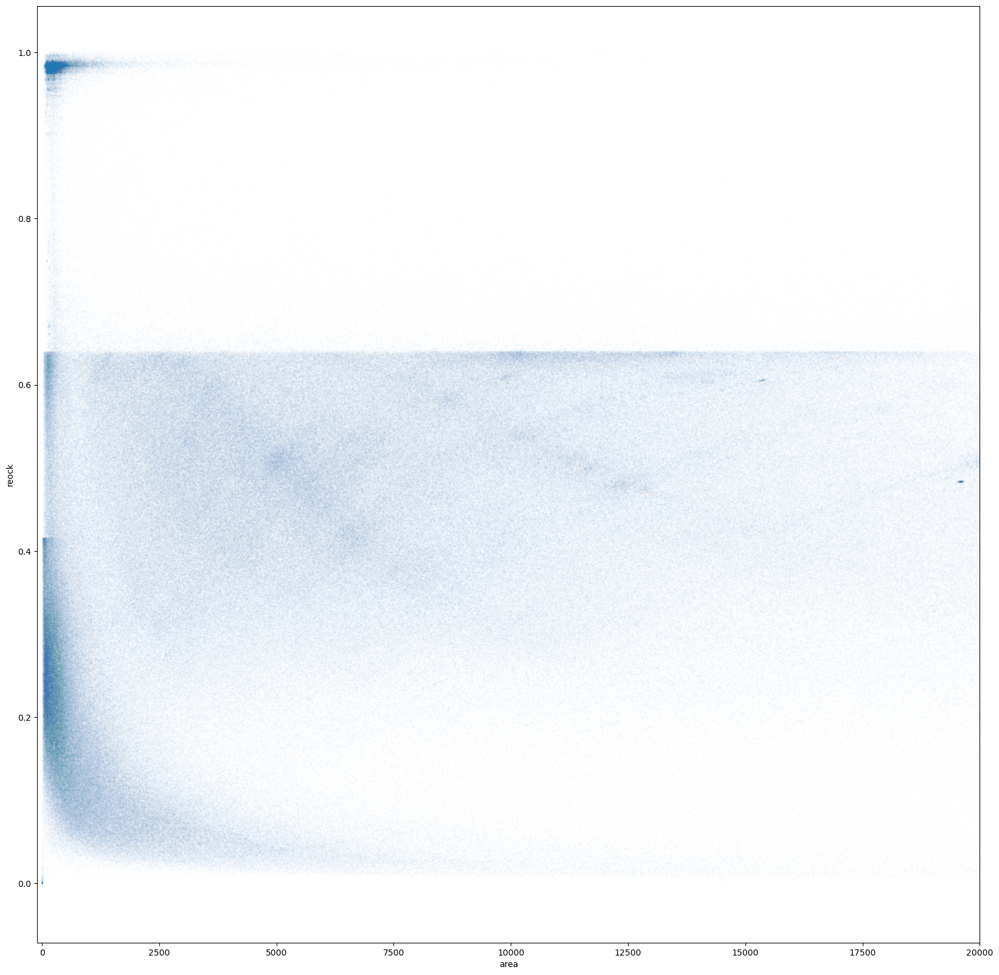

In [9]:
ax = all_poly_data.plot.scatter('area', 'reock', figsize=(20, 20), s=.0001)
ax.set_xlim(-100, 20000)
# ax.set_ylim(0, 2500)

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

(-100.0, 20000.0)

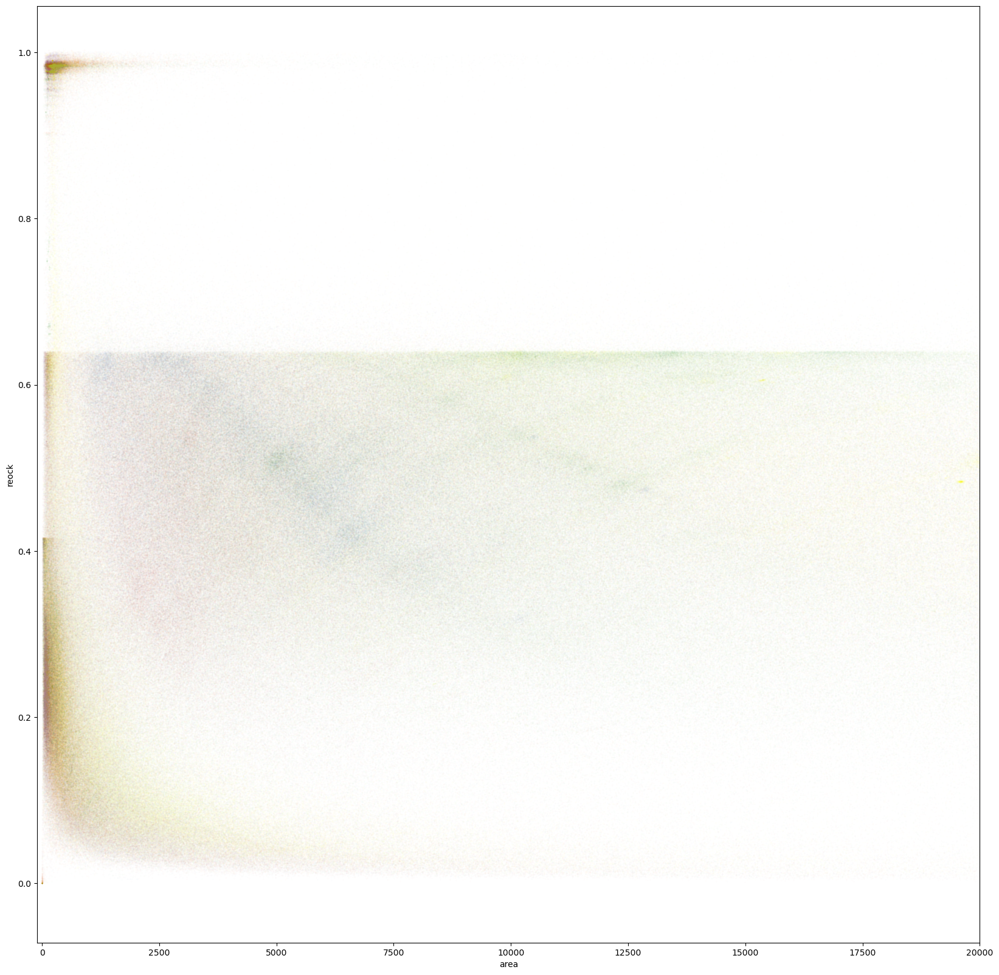

In [10]:
fig, ax = plt.subplots(figsize=(20, 20))
for i, c in enumerate(sample.continent.unique()):
    all_poly_data[all_poly_data.continent == c].plot.scatter('area', 'reock', s=.0001, color=cm.Set1(i), ax=ax)
ax.set_xlim(-100, 20000)
# ax.set_ylim(0, 2500)

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

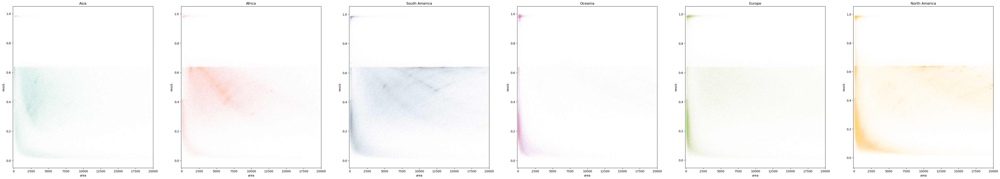

In [11]:
fig, ax = plt.subplots(1, 6, figsize=(60, 10))
for i, c in enumerate(sample.continent.unique()):
    all_poly_data[all_poly_data.continent == c].plot.scatter('area', 'reock', s=.00005, color=cm.Set2(i), ax=ax[i])
    ax[i].set_xlim(-100, 20000)
    ax[i].set_title(c)
# ax.set_ylim(0, 2500)

<AxesSubplot: ylabel='Frequency'>

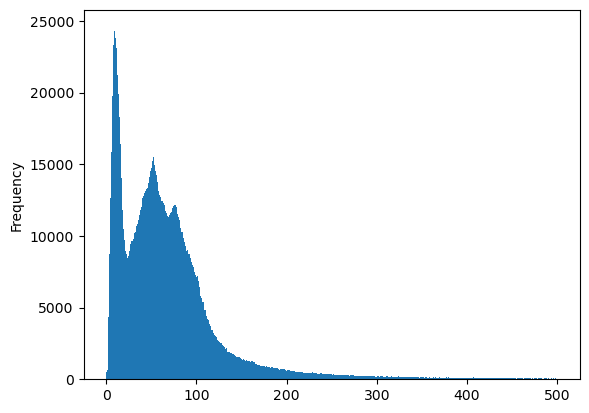

In [25]:
filt = (all_poly_data.shape_index > 0) & (all_poly_data.shape_index < 500)
all_poly_data.shape_index[filt].plot.hist(bins=1000)

In [26]:
small_set = all_poly_data.query('area < 20000').sample(10000, random_state=42)

In [27]:
centroid = small_set.centroid
small_set['x'] = centroid.x
small_set['y'] = centroid.y

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

(-100.0, 20000.0)

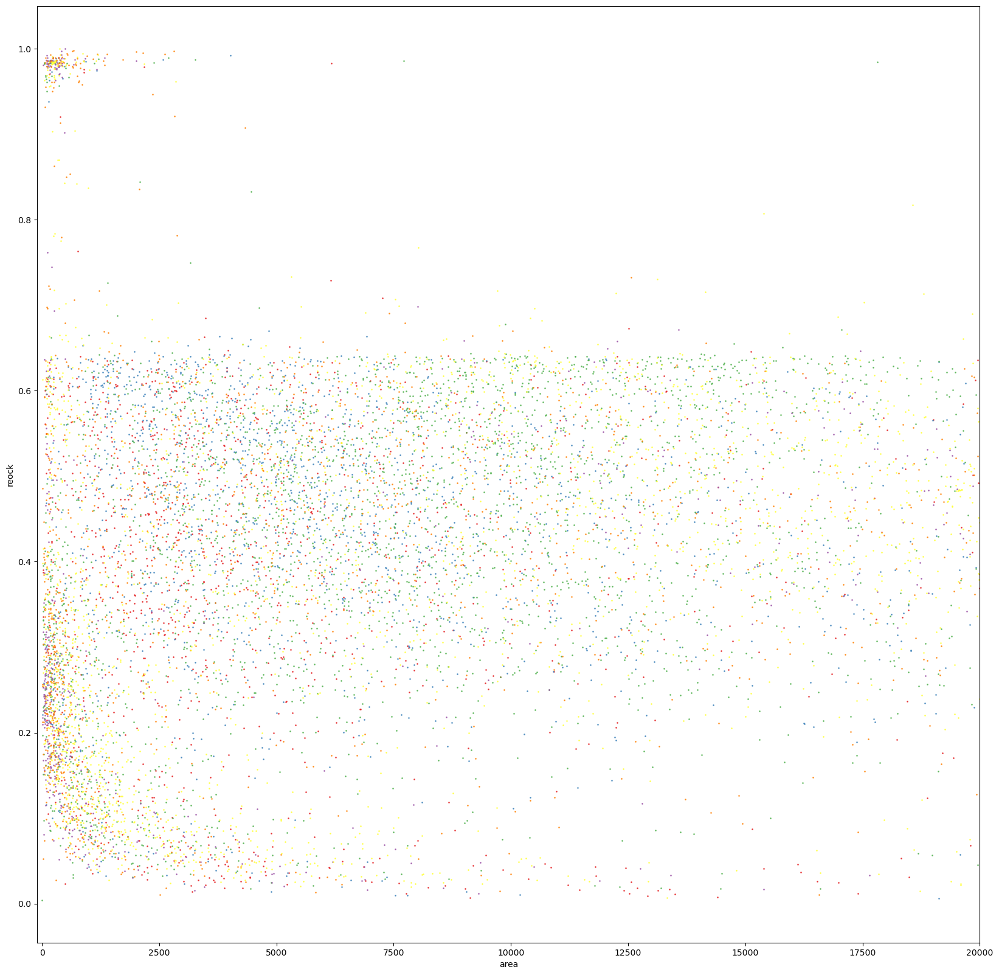

In [32]:
fig, ax = plt.subplots(figsize=(20, 20))
for i, c in enumerate(sample.continent.unique()):
    small_set[small_set.continent == c].plot.scatter('area', 'reock', s=1, color=cm.Set1(i), ax=ax, alpha=.7)
ax.set_xlim(-100, 20000)



In [28]:
from shapely.affinity import translate

In [35]:
translated = []
for i, row in small_set.iterrows():
    y = row.reock * 10000
    x = row.area / 2
    g = translate(row.geometry, xoff=-(row.x - x), yoff=-(row.y - y))
    
    translated.append(g)
small_set['translated'] = geopandas.GeoSeries(translated, index=small_set.index)

In [34]:
y = small_set.reock.iloc[0] * 10000
x = small_set.area.iloc[0] / 2
translate(small_set.geometry.iloc[0], xoff=-(small_set.x.iloc[0] - x), yoff=-(small_set.y.iloc[0] - y)).wkt

'POLYGON ((2924.187201213732 2891.288373835385, 2903.188622013782 2861.8221659539267, 2900.2810038772295 2857.7560718134046, 2874.9067361846683 2876.025369551964, 2849.972377379774 2892.469118782319, 2837.353827205312 2898.632978531532, 2824.9201988657005 2902.5631190212443, 2797.5817621060996 2968.2981568519026, 2796.865369167819 2974.7124269986525, 2797.6913834610605 2978.556451536715, 2802.1953872511513 2981.1953255943954, 2904.6256032932433 2905.709330345504, 2924.187201213732 2891.288373835385))'

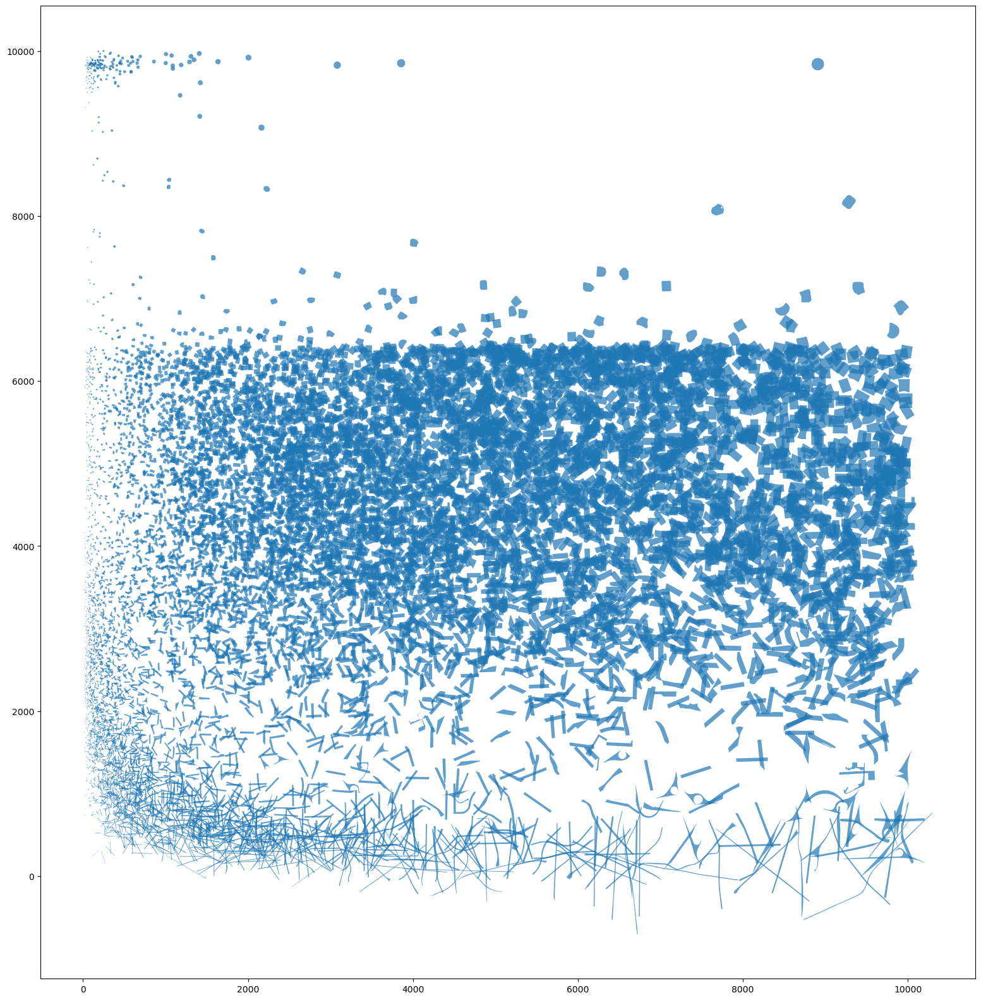

In [36]:
ax = small_set.set_geometry('translated').plot(aspect=1, figsize=(20, 20), alpha=.7)

In [64]:
all_poly_data[all_poly_data['area']<0]

,geometry,area,reock,shape_index,continent,country,name


<AxesSubplot: >

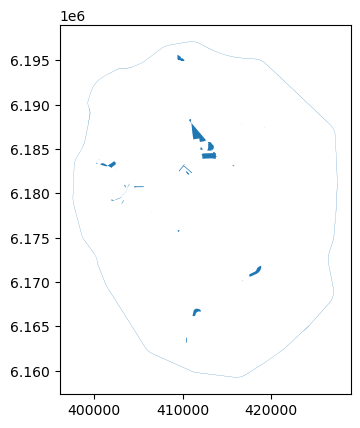

In [55]:
negative_area.iloc[[0]].plot()

In [49]:
val = geopandas.GeoSeries(pygeos.make_valid(negative_area.geometry.values.data))

/Users/martin/mambaforge/envs/stable/lib/python3.10/site-packages/pygeos/constructive.py:478: RuntimeWarning: invalid value encountered in make_valid
  return lib.make_valid(geometry, **kwargs)


In [59]:
len(val.iloc[0].geoms)

28